# GR 5242 Final Project Group 22
## Neural Style Transfer
### Ran Lu rl3077, Kevin Cho kc3313, Jiaxiang Wang jw3864, Zhenyu Jia zj2268

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
%cd /content/drive/MyDrive/Colab Notebooks/GR_5242_Project

/content/drive/MyDrive/Colab Notebooks/GR 5242 Project


In [ ]:
from tensorflow.keras.models import Model
from matplotlib import pyplot as plt
from PIL import Image

import matplotlib.gridspec as gridspec
import tensorflow as tf
import numpy as np

tf.executing_eagerly()

True

### Naive Model 1

In [ ]:
def get_noise_image(content_img, seed):
    np.random.seed(seed)
    img = np.random.uniform(0, 1, content_img.shape).astype(np.float32)
    return img

def load_and_process_image(content_path, style_path):
    content_img = Image.open(content_path)
    content_img = np.array(content_img)
    content_shape = content_img.shape[:2]
    content_shape = content_shape[::-1]
    
    style_img = Image.open(style_path)
    style_img = style_img.resize(content_shape)
    style_img = np.array(style_img)
    
    return content_img, style_img


def display_result(content_path, style_path, best_img=None):
    content_img, style_img = load_and_process_image(content_path, style_path)
    
    fig = plt.figure(figsize=(13,13))
    gridspec.GridSpec(2,2)

    plt.subplot2grid((3,2), (0,0))
    plt.imshow(content_img)
    plt.title('Content Image')
    plt.axis('off')
    
    plt.subplot2grid((3,2), (0,1))
    plt.imshow(style_img)
    plt.title('Style Image')
    plt.axis('off')
    
    if best_img is not None:
        plt.subplot2grid((3,2), (1,0), colspan=2, rowspan=2)
        plt.imshow(best_img)
        plt.title('Style Transfer Output')
        plt.axis('off')

    fig.tight_layout()



In [ ]:
def get_content_loss(base_content, target_content):
    return tf.reduce_mean(tf.square(base_content - target_content))


def get_style_loss(base_style, target_style):
    return tf.reduce_mean(tf.square(base_style - target_style)) 


def compute_loss(base_img, target_content, target_style, content_weight, style_weight):
    
    content_loss = 0
    style_loss = 0

    content_loss = get_content_loss(base_img, target_content)
    style_loss = get_style_loss(base_img, target_style)
        
    content_loss *= content_weight
    style_loss *= style_weight
    
    total_loss = content_loss + style_loss
    
    return total_loss, content_loss, style_loss
        

In [ ]:
def compute_grad(config):
    with tf.GradientTape() as tape:
        all_loss = compute_loss(**config)
    total_loss = all_loss[0]
    return tape.gradient(total_loss, config['base_img']), all_loss

In [ ]:
def style_transfer_naive1(content_path, style_path, content_weight, style_weight, num_iterations=500):
    
    target_content, target_style = load_and_process_image(content_path, style_path)

    # base_img = tf.Variable(target_content.copy(), dtype='float')

    noise_img = get_noise_image(target_content, 0)
    base_img = tf.Variable(noise_img.copy())
    
    target_content = tf.Variable(target_content, dtype='float')
    target_style = tf.Variable(target_style, dtype='float')
    
    config = {'base_img': base_img,
              'target_content': target_content,
              'target_style': target_style,
              'content_weight': content_weight,
              'style_weight': style_weight}
    
    min_vals = 0
    max_vals = 255
    
    best_loss, best_image = float('inf'), None
    
    optim = tf.keras.optimizers.Adam(learning_rate=5, beta_1=0.99, epsilon=0.1)

    total_loss_hist = np.zeros(num_iterations)
    
    for i in range(num_iterations):
        grad, all_loss = compute_grad(config)
        total_loss, content_loss, style_loss = all_loss
        total_loss_hist[i] = total_loss
        optim.apply_gradients([(grad, base_img)])
        clipped_img = tf.clip_by_value(base_img, min_vals, max_vals)
        base_img.assign(clipped_img)
        
        if total_loss < best_loss:
            best_loss = total_loss
            best_img = base_img.numpy()
        
    return best_loss, best_img, total_loss_hist



In [ ]:
content_path1 = 'Image/content1.jpg'
content_path2 = 'Image/content2.jpg'
style_path1 = 'Image/style1.jpg'
style_path2 = 'Image/style2.jpg'

Time Taken =  4.8597352504730225


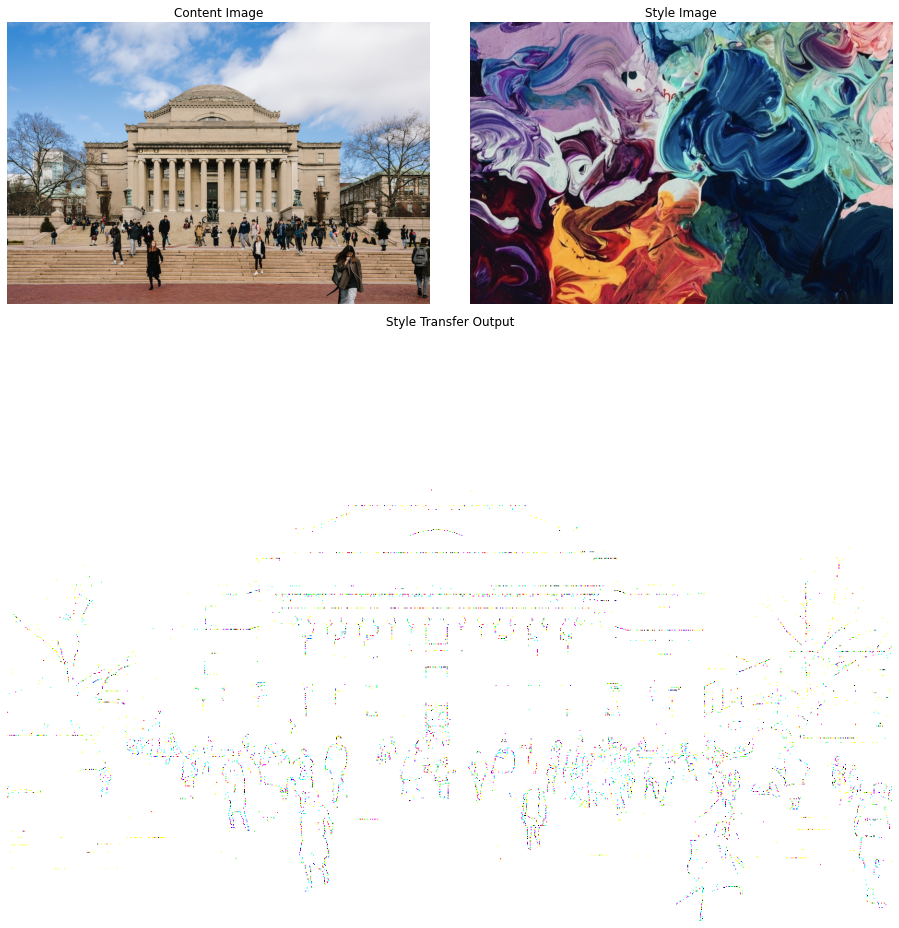

In [ ]:
content_weight = 1e3
style_weight = 1e-2
import time
start_time = time.time()
best_loss11, best_img11, total_loss_naive1 = style_transfer_naive1(content_path1, style_path1, content_weight, style_weight, num_iterations=1000)
display_result(content_path1, style_path1, best_img11)
end_time = time.time()
print('Time Taken = ', end_time-start_time)

### Naive Model 2

In [ ]:
def get_noise_image(content_img, seed):
    np.random.seed(seed)
    img = np.random.uniform(0, 1, content_img.shape).astype(np.float32)
    return img

    
def load_and_process_image(content_path, style_path):
    content_img = Image.open(content_path)
    content_img = np.array(content_img)
    content_shape = content_img.shape[:2]
    content_shape = content_shape[::-1]
    
    style_img = Image.open(style_path)
    style_img = style_img.resize(content_shape)
    style_img = np.array(style_img)

    style_img = tf.expand_dims(style_img, axis=0)
    content_img = tf.expand_dims(content_img, axis=0)
    
    return content_img, style_img

# ???
def deprocess_image(processed_img):
    x = processed_img.copy()
    if len(x.shape) == 4:
        x = np.squeeze(x, 0)
  
    # perform the inverse of the preprocessing step
    x[:, :, 0] += 103.939
    x[:, :, 1] += 116.779
    x[:, :, 2] += 123.68
    x = x[:, :, ::-1]
    x = np.clip(x, 0, 255).astype('uint8')
    
    return x


def display_result(content_path, style_path, best_img=None):
    content_img, style_img = load_and_process_image(content_path, style_path)

    if len(content_img.shape) > 3:
      content_img = np.squeeze(content_img, axis=0)

    if len(style_img.shape) > 3:
      style_img = np.squeeze(style_img, axis=0)
    
    fig = plt.figure(figsize=(13,13))
    gridspec.GridSpec(2,2)

    plt.subplot2grid((3,2), (0,0))
    plt.imshow(content_img)
    plt.title('Content Image')
    plt.axis('off')
    
    plt.subplot2grid((3,2), (0,1))
    plt.imshow(style_img)
    plt.title('Style Image')
    plt.axis('off')
    
    if best_img is not None:
        plt.subplot2grid((3,2), (1,0), colspan=2, rowspan=2)
        plt.imshow(best_img)
        plt.title('Style Transfer Output')
        plt.axis('off')

    fig.tight_layout()


In [ ]:
def build_model():
    
    # VGG19 based 
    vgg19 = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
    vgg19.trainable = False
    
    content_layers = ['block5_conv2']
    style_layers = ['block5_conv1']

    content_outputs = [vgg19.get_layer(name).output for name in content_layers]
    style_outputs = [vgg19.get_layer(name).output for name in style_layers]

    model_outputs = content_outputs + style_outputs

    model = Model(inputs=vgg19.input, outputs=model_outputs)
    
    return model
    

def feature_extract(model, img, mode, num_content_layers=1):
    outputs = model(img)

    if mode == 'content':
      feature = [out for out in outputs[:num_content_layers]]
    elif mode == 'style':
      feature = [out for out in outputs[num_content_layers:]]
    
    return feature


In [ ]:
def get_content_loss(base_content, target_content):
    return tf.reduce_mean(tf.square(base_content - target_content))


def get_style_loss(base_style, target_style):
    return tf.reduce_mean(tf.square(base_style - target_style))
    

def compute_loss(model, base_img, target_content, target_style, content_weight, style_weight):
    
    content_loss = 0
    style_loss = 0
    
    base_content = feature_extract(model, base_img, mode='content')
    base_style = feature_extract(model, base_img, mode='style')
    
    layer_weight_content = 1/len(target_content)
    for bc, tc in zip(base_content, target_content):
        content_loss += layer_weight_content * get_content_loss(bc, tc)
        
    layer_weight_style = 1/len(target_style)
    for bs, ts in zip(base_style, target_style):
        style_loss += layer_weight_style * get_style_loss(bs, ts)
        
    content_loss *= content_weight
    style_loss *= style_weight
    
    total_loss = content_loss + style_loss
    
    return total_loss, content_loss, style_loss
        

In [ ]:
def compute_grad(config):
    with tf.GradientTape() as tape:
        tape.watch(config['base_img'])
        total_loss = compute_loss(**config)[0]
    return tape.gradient(total_loss, config['base_img']), total_loss


In [ ]:
model = build_model()
def style_transfer_naive2(content_path, style_path, content_weight, style_weight, num_iterations=500):

    content_img, style_img = load_and_process_image(content_path, style_path)
    
    content_img = tf.keras.applications.vgg19.preprocess_input(content_img)
    style_img = tf.keras.applications.vgg19.preprocess_input(style_img)

    # base_img = tf.identity(content_img)
    # base_img = tf.cast(base_img, dtype='float')
    # base_img = tf.Variable(base_img)

    noise_img = get_noise_image(content_img, 0)
    base_img = tf.Variable(noise_img.copy())
    
    target_content = feature_extract(model, content_img, mode='content')
    target_style = feature_extract(model, style_img, mode='style')
    
    config = {'model': model,
              'base_img': base_img,
              'target_content': target_content,
              'target_style': target_style,
              'content_weight': content_weight,
              'style_weight': style_weight}
    
    norm_means = np.array([103.939, 116.779, 123.68])
    min_vals = -norm_means
    max_vals = 255 - norm_means 
    
    best_loss, best_image = float('inf'), None
    
    optim = tf.keras.optimizers.Adam(learning_rate=5, beta_1=0.99, epsilon=0.1)

    total_loss_hist = np.zeros(num_iterations)
    
    for i in range(num_iterations):
        grad, total_loss = compute_grad(config)
        total_loss_hist[i] = total_loss
        optim.apply_gradients([(grad, base_img)])
        # ???
        clipped_img = tf.clip_by_value(base_img, min_vals, max_vals)
        base_img.assign(clipped_img)
        
        if total_loss < best_loss:
            best_loss = total_loss
            best_img = deprocess_image(base_img.numpy())
        
    return best_loss, best_img, total_loss_hist


In [ ]:
content_weight = 1e3
style_weight = 1e-2
import time
start_time = time.time()
best_loss11, best_img11, total_loss_naive2 = style_transfer_naive2(content_path1, style_path1, content_weight, style_weight, num_iterations=1000)
display_result(content_path1, style_path1, best_img11)
end_time = time.time()
print('Time Taken = ', end_time-start_time)

Output hidden; open in https://colab.research.google.com to view.

### Naive Model 3

In [ ]:
def get_noise_image(content_img, seed):
    np.random.seed(seed)
    img = np.random.uniform(0, 1, content_img.shape).astype(np.float32)
    return img


def load_image(img_path):
    img = Image.open(img_path)
    
    # limit the size of image to be 512 pixels
    max_dim = 512
    scale = max_dim/max(img.size)
    img = img.resize((round(img.size[0]*scale), round(img.size[1]*scale)), Image.ANTIALIAS)
    img = np.array(img).astype('uint8')
    
    return img


def load_and_process_image(img_path):
    img = load_image(img_path)
    
    # add batch dim for training purpose 
    img = np.expand_dims(img, axis=0)
    
    img = tf.keras.applications.vgg19.preprocess_input(img)
    
    return img

# ???
def deprocess_image(processed_img):
    x = processed_img.copy()
    if len(x.shape) == 4:
        x = np.squeeze(x, 0)
  
    # perform the inverse of the preprocessing step
    x[:, :, 0] += 103.939
    x[:, :, 1] += 116.779
    x[:, :, 2] += 123.68
    x = x[:, :, ::-1]
    x = np.clip(x, 0, 255).astype('uint8')
    
    return x


def display_result(content_path, style_path, best_img=None):
    content_img = load_image(content_path)
    style_img = load_image(style_path)
    
    fig = plt.figure(figsize=(13,13))
    gridspec.GridSpec(2,2)

    plt.subplot2grid((3,2), (0,0))
    plt.imshow(content_img)
    plt.title('Content Image')
    plt.axis('off')
    
    plt.subplot2grid((3,2), (0,1))
    plt.imshow(style_img)
    plt.title('Style Image')
    plt.axis('off')
    
    if best_img is not None:
        plt.subplot2grid((3,2), (1,0), colspan=2, rowspan=2)
        plt.imshow(best_img)
        plt.title('Style Transfer Output')
        plt.axis('off')

    fig.tight_layout()


In [ ]:
def build_model():
    
    # VGG19 based 
    vgg19 = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
    vgg19.trainable = False
    
    content_layers = ['block5_conv2']
    style_layers = ['block5_conv1']

    content_outputs = [vgg19.get_layer(name).output for name in content_layers]
    style_outputs = [vgg19.get_layer(name).output for name in style_layers]

    model_outputs = content_outputs + style_outputs

    model = Model(inputs=vgg19.input, outputs=model_outputs)
    
    return model
    

def feature_extract(model, img, mode, num_content_layers=1):
    outputs = model(img)

    if mode == 'content':
      feature = [out for out in outputs[:num_content_layers]]
    elif mode == 'style':
      feature = [out for out in outputs[num_content_layers:]]
    
    return feature


In [ ]:
def get_content_loss(base_content, target_content):
    return tf.reduce_mean(tf.square(base_content - target_content))


def gram_matrix(input_tensor):
    num_filters = input_tensor.shape[-1]
    
    i = tf.reshape(input_tensor, [-1, num_filters])
    n = i.shape[0]
    gram = tf.matmul(i, i, transpose_a=True)
    
    return gram/n


def get_style_loss(base_style, target_style_gram):
    _, h, w, c = base_style.shape
    
    base_style_gram = gram_matrix(base_style)
    
    return tf.reduce_mean(tf.square(base_style_gram - target_style_gram)) #/ (4 * c**2 * (h*w)**2)


def compute_loss(model, base_img, target_content, target_style_gram, content_weight, style_weight):
    
    content_loss = 0
    style_loss = 0
    
    base_content = feature_extract(model, base_img, mode='content')
    base_style = feature_extract(model, base_img, mode='style')
    
    layer_weight_content = 1/len(target_content)
    for bc, tc in zip(base_content, target_content):
        content_loss += layer_weight_content * get_content_loss(bc, tc)
        
    layer_weight_style = 1/len(target_style_gram)
    for bs, tsg in zip(base_style, target_style_gram):
        style_loss += layer_weight_style * get_style_loss(bs, tsg)
        
    content_loss *= content_weight
    style_loss *= style_weight
    
    total_loss = content_loss + style_loss
    
    return total_loss, content_loss, style_loss
        

In [ ]:
def compute_grad(config):
    with tf.GradientTape() as tape:
        total_loss = compute_loss(**config)[0]
    return tape.gradient(total_loss, config['base_img']), total_loss


In [ ]:
model = build_model()
def style_transfer_naive3(content_path, style_path, content_weight, style_weight, num_iterations=500):

    content_img = load_and_process_image(content_path)
    style_img = load_and_process_image(style_path)

    # base_img = tf.Variable(content_img.copy())

    noise_img = get_noise_image(content_img, 0)
    base_img = tf.Variable(noise_img.copy())
    
    target_content = feature_extract(model, content_img, mode='content')
    
    target_style = feature_extract(model, style_img, mode='style')
    target_style_gram = [gram_matrix(ts) for ts in target_style]
    
    config = {'model': model,
              'base_img': base_img,
              'target_content': target_content,
              'target_style_gram': target_style_gram,
              'content_weight': content_weight,
              'style_weight': style_weight}
    
    norm_means = np.array([103.939, 116.779, 123.68])
    min_vals = -norm_means
    max_vals = 255 - norm_means 
    
    best_loss, best_image = float('inf'), None
    
    optim = tf.keras.optimizers.Adam(learning_rate=5, beta_1=0.99, epsilon=0.1)

    total_loss_hist = np.zeros(num_iterations)
    
    for i in range(num_iterations):
        grad, total_loss = compute_grad(config)
        total_loss_hist[i] = total_loss
        optim.apply_gradients([(grad, base_img)])
        # ???
        clipped_img = tf.clip_by_value(base_img, min_vals, max_vals)
        base_img.assign(clipped_img)
        
        if total_loss < best_loss:
            best_loss = total_loss
            best_img = deprocess_image(base_img.numpy())
        
    return best_loss, best_img, total_loss_hist


In [ ]:
content_weight = 1e3
style_weight = 1e-2
import time
start_time = time.time()
best_loss11, best_img11, total_loss_naive3 = style_transfer_naive3(content_path1, style_path1, content_weight, style_weight, num_iterations=1000)
display_result(content_path1, style_path1, best_img11)
end_time = time.time()
print('Time Taken = ', end_time-start_time)

Output hidden; open in https://colab.research.google.com to view.

### Proposed Method (VGG-19)

In [ ]:
def get_noise_image(noise_ratio, content_img, seed):
    np.random.seed(seed)
    noise_img = np.random.uniform(-20., 20., content_img.shape).astype(np.float32)
    img = noise_ratio * noise_img + (1.-noise_ratio) * content_img
    return img

In [ ]:
def load_image(img_path):
    img = Image.open(img_path)
    
    # limit the size of image to be 512 pixels
    max_dim = 512
    scale = max_dim/max(img.size)
    img = img.resize((round(img.size[0]*scale), round(img.size[1]*scale)), Image.ANTIALIAS)
    img = np.array(img).astype('uint8')
    
    return img


def load_and_process_image(img_path):
    img = load_image(img_path)
    
    # add batch dim for training purpose 
    img = np.expand_dims(img, axis=0)
    
    img = tf.keras.applications.vgg19.preprocess_input(img)
    
    return img

# ???
def deprocess_image(processed_img):
    x = processed_img.copy()
    if len(x.shape) == 4:
        x = np.squeeze(x, 0)
  
    # perform the inverse of the preprocessing step
    x[:, :, 0] += 103.939
    x[:, :, 1] += 116.779
    x[:, :, 2] += 123.68
    x = x[:, :, ::-1]
    x = np.clip(x, 0, 255).astype('uint8')
    
    return x


def display_result(content_path, style_path, best_img=None):
    content_img = load_image(content_path)
    style_img = load_image(style_path)
    
    fig = plt.figure(figsize=(13,13))
    gridspec.GridSpec(2,2)

    plt.subplot2grid((3,2), (0,0))
    plt.imshow(content_img)
    plt.title('Content Image')
    plt.axis('off')
    
    plt.subplot2grid((3,2), (0,1))
    plt.imshow(style_img)
    plt.title('Style Image')
    plt.axis('off')
    
    if best_img is not None:
        plt.subplot2grid((3,2), (1,0), colspan=2, rowspan=2)
        plt.imshow(best_img)
        plt.title('Style Transfer Output')
        plt.axis('off')

    fig.tight_layout()


In [ ]:
def build_model():
    
    # VGG19 based 
    vgg19 = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
    vgg19.trainable = False
    
    content_layers = ['block5_conv2']
    style_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1', 'block5_conv1']

    content_outputs = [vgg19.get_layer(name).output for name in content_layers]
    style_outputs = [vgg19.get_layer(name).output for name in style_layers]

    model_outputs = content_outputs + style_outputs

    model = Model(inputs=vgg19.input, outputs=model_outputs)
    
    return model
    

def feature_extract(model, img, mode, num_content_layers=1):
    outputs = model(img)

    if mode == 'content':
      feature = [out for out in outputs[:num_content_layers]]
    elif mode == 'style':
      feature = [out for out in outputs[num_content_layers:]]
    
    return feature


In [ ]:
def get_content_loss(base_content, target_content):
    return tf.reduce_mean(tf.square(base_content - target_content))


def gram_matrix(input_tensor):
    num_filters = input_tensor.shape[-1]
    
    i = tf.reshape(input_tensor, [-1, num_filters])
    n = i.shape[0]
    gram = tf.matmul(i, i, transpose_a=True)
    
    return gram/n


def get_style_loss(base_style, target_style_gram):
    _, h, w, c = base_style.shape
    
    base_style_gram = gram_matrix(base_style)
    
    return tf.reduce_mean(tf.square(base_style_gram - target_style_gram)) #/ (4 * c**2 * (h*w)**2)


def compute_loss(model, base_img, target_content, target_style_gram, content_weight, style_weight):
    
    content_loss = 0
    style_loss = 0
    
    base_content = feature_extract(model, base_img, mode='content')
    base_style = feature_extract(model, base_img, mode='style')
    
    layer_weight_content = 1/len(target_content)
    for bc, tc in zip(base_content, target_content):
        content_loss += layer_weight_content * get_content_loss(bc, tc)
        
    layer_weight_style = 1/len(target_style_gram)
    for bs, tsg in zip(base_style, target_style_gram):
        style_loss += layer_weight_style * get_style_loss(bs, tsg)
        
    content_loss *= content_weight
    style_loss *= style_weight
    
    total_loss = content_loss + style_loss
    
    return total_loss, content_loss, style_loss
        

In [ ]:
def compute_grad(config):
    with tf.GradientTape() as tape:
        total_loss = compute_loss(**config)[0]
    return tape.gradient(total_loss, config['base_img']), total_loss


In [ ]:
model = build_model()
def style_transfer_19(content_path, style_path, content_weight, style_weight, num_iterations=500, seed=0):

    content_img = load_and_process_image(content_path)
    style_img = load_and_process_image(style_path)
    noise_img = get_noise_image(0.5, content_img, seed)
    base_img = tf.Variable(noise_img.copy())
    
    target_content = feature_extract(model, content_img, mode='content')
    
    target_style = feature_extract(model, style_img, mode='style')
    target_style_gram = [gram_matrix(ts) for ts in target_style]
    
    config = {'model': model,
              'base_img': base_img,
              'target_content': target_content,
              'target_style_gram': target_style_gram,
              'content_weight': content_weight,
              'style_weight': style_weight}
    
    norm_means = np.array([103.939, 116.779, 123.68])
    min_vals = -norm_means
    max_vals = 255 - norm_means 
    
    best_loss, best_image = float('inf'), None
    
    optim = tf.keras.optimizers.Adam(learning_rate=5, beta_1=0.99, epsilon=0.1)
    total_loss_all = []
    for i in range(num_iterations):
        grad, total_loss = compute_grad(config)
        total_loss_all.append(total_loss)
        optim.apply_gradients([(grad, base_img)])
        # ???
        clipped_img = tf.clip_by_value(base_img, min_vals, max_vals)
        base_img.assign(clipped_img)
        
        if total_loss < best_loss:
            best_loss = total_loss
            best_img = deprocess_image(base_img.numpy())
        
    return best_loss, best_img, total_loss_all


In [ ]:
content_weight = 1e3
style_weight = 1e-2

In [ ]:
import time
start_time = time.time()
best_loss11, best_img11, total_loss11_19 = style_transfer_19(content_path1, style_path1, content_weight, style_weight, num_iterations=1000)
display_result(content_path1, style_path1, best_img11)
end_time = time.time()
print('Time Taken = ', end_time-start_time)

Output hidden; open in https://colab.research.google.com to view.

Time Taken =  109.17424702644348


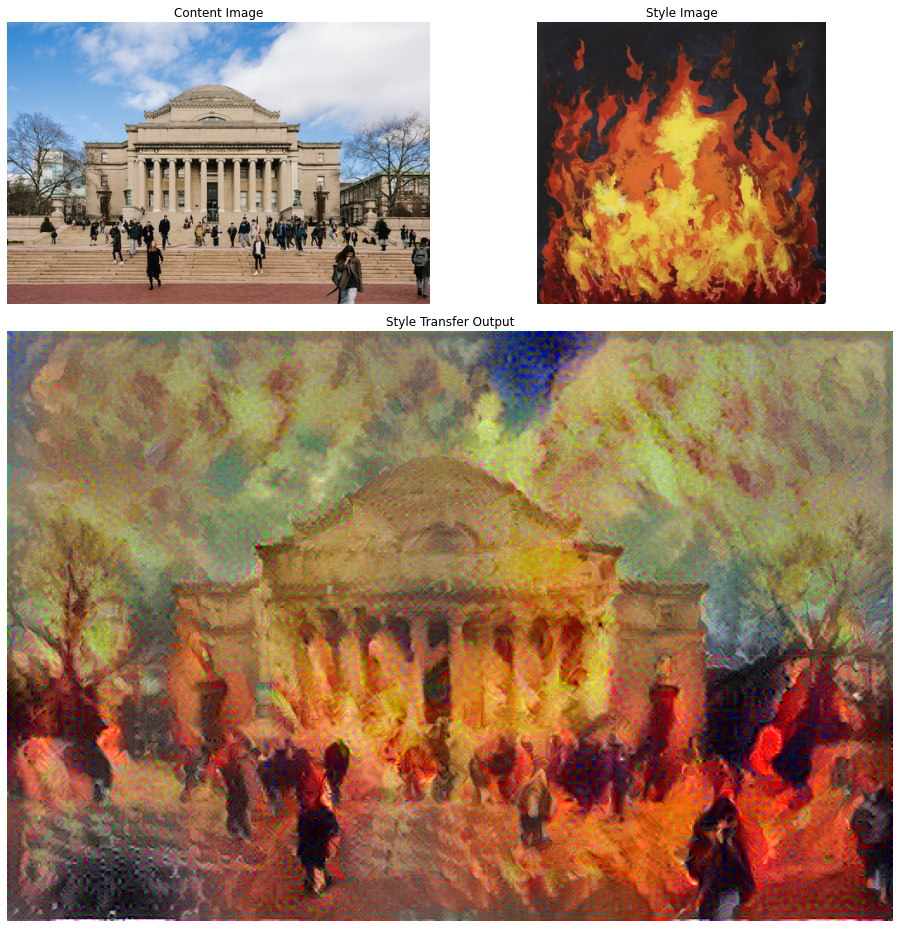

In [ ]:
import time
start_time = time.time()
best_loss12, best_img12, total_loss12_19 = style_transfer_19(content_path1, style_path2, content_weight, style_weight, num_iterations=1000)
display_result(content_path1, style_path2, best_img12)
end_time = time.time()
print('Time Taken = ', end_time-start_time)

Time Taken =  113.62923216819763


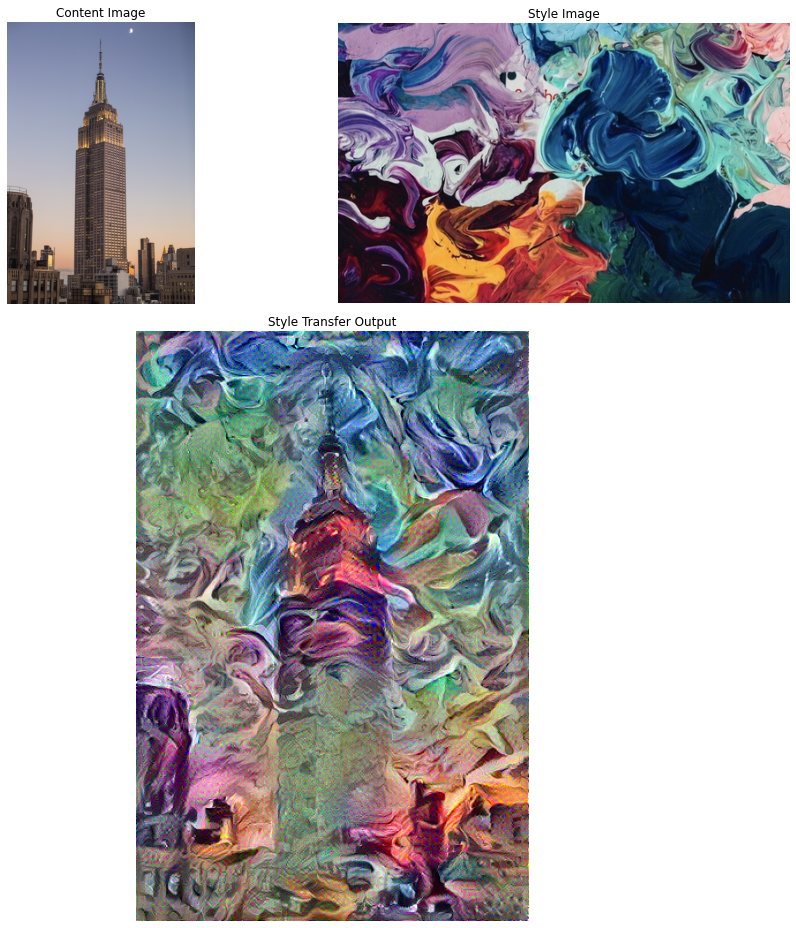

In [ ]:
import time
start_time = time.time()
best_loss21, best_img21, total_loss21_19 = style_transfer_19(content_path2, style_path1, content_weight, style_weight, num_iterations=1000)
display_result(content_path2, style_path1, best_img21)
end_time = time.time()
print('Time Taken = ', end_time-start_time)

Time Taken =  113.59497928619385


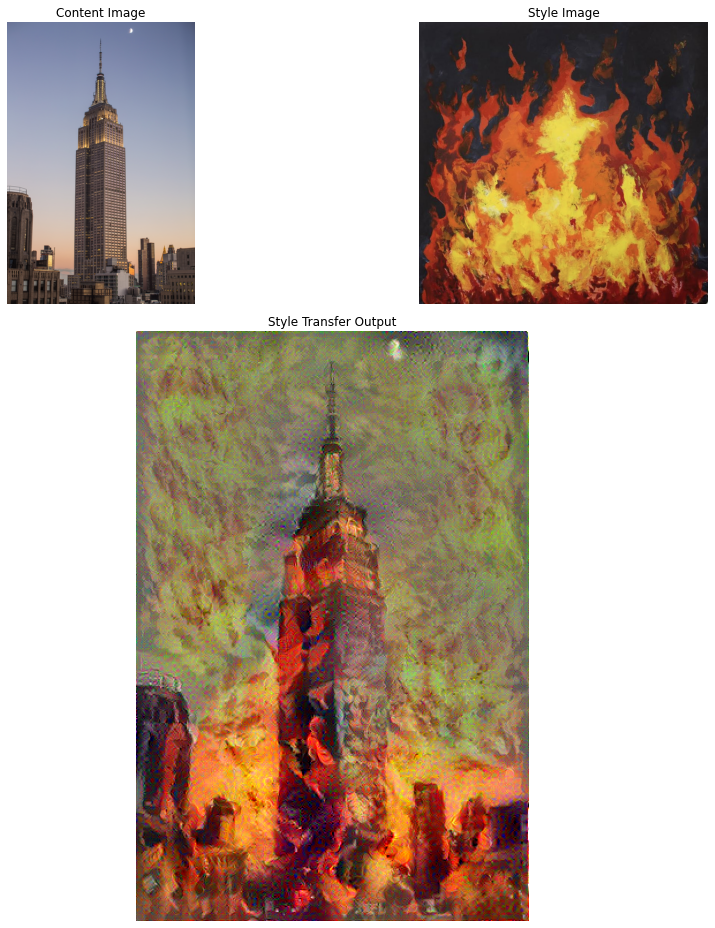

In [ ]:
import time
start_time = time.time()
best_loss22, best_img22, total_loss2_19 = style_transfer_19(content_path2, style_path2, content_weight, style_weight, num_iterations=1000)
display_result(content_path2, style_path2, best_img22)
end_time = time.time()
print('Time Taken = ', end_time-start_time)

### Hyperparameter Tuning

**Number of Iteration**

In [ ]:
best_loss11, best_img11 = style_transfer(content_path1, style_path1, content_weight, style_weight, num_iterations=100)
display_result(content_path1, style_path1, best_img11)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
best_loss11, best_img11 = style_transfer(content_path1, style_path1, content_weight, style_weight, num_iterations=500)
display_result(content_path1, style_path1, best_img11)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
best_loss11, best_img11 = style_transfer(content_path1, style_path1, content_weight, style_weight, num_iterations=2000)
display_result(content_path1, style_path1, best_img11)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
best_loss11, best_img11 = style_transfer(content_path1, style_path1, content_weight, style_weight, num_iterations=4000)
display_result(content_path1, style_path1, best_img11)

Output hidden; open in https://colab.research.google.com to view.

**Different weights**

In [ ]:
content_weight = 1e5
style_weight = 1e-3

best_loss11, best_img11 = style_transfer(content_path1, style_path1, content_weight, style_weight, num_iterations=1000)
display_result(content_path1, style_path1, best_img11)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
content_weight = 1e1
style_weight = 1e5

best_loss11, best_img11 = style_transfer(content_path1, style_path1, content_weight, style_weight, num_iterations=1000)
display_result(content_path1, style_path1, best_img11)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
content_weight = 1e3
style_weight = 1e-1

best_loss11, best_img11 = style_transfer(content_path1, style_path1, content_weight, style_weight, num_iterations=1000)
display_result(content_path1, style_path1, best_img11)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
content_weight = 1
style_weight = 1e2

best_loss11, best_img11 = style_transfer(content_path1, style_path1, content_weight, style_weight, num_iterations=1000)
display_result(content_path1, style_path1, best_img11)

Output hidden; open in https://colab.research.google.com to view.

**Different learning rate**

In [ ]:
model = build_model()
def style_transfer(content_path, style_path, content_weight, style_weight, num_iterations=500, seed=0, learning_rate = 5):

    content_img = load_and_process_image(content_path)
    style_img = load_and_process_image(style_path)
    noise_img = get_noise_image(0.5, content_img, seed)
    base_img = tf.Variable(noise_img.copy())
    
    target_content = feature_extract(model, content_img, mode='content')
    
    target_style = feature_extract(model, style_img, mode='style')
    target_style_gram = [gram_matrix(ts) for ts in target_style]
    
    config = {'model': model,
              'base_img': base_img,
              'target_content': target_content,
              'target_style_gram': target_style_gram,
              'content_weight': content_weight,
              'style_weight': style_weight}
    
    norm_means = np.array([103.939, 116.779, 123.68])
    min_vals = -norm_means
    max_vals = 255 - norm_means 
    
    best_loss, best_image = float('inf'), None
    
    optim = tf.keras.optimizers.Adam(learning_rate, beta_1=0.99, epsilon=0.1)
    
    for i in range(num_iterations):
        grad, total_loss = compute_grad(config)
        optim.apply_gradients([(grad, base_img)])
        # ???
        clipped_img = tf.clip_by_value(base_img, min_vals, max_vals)
        base_img.assign(clipped_img)
        
        if total_loss < best_loss:
            best_loss = total_loss
            best_img = deprocess_image(base_img.numpy())
        
    return best_loss, best_img


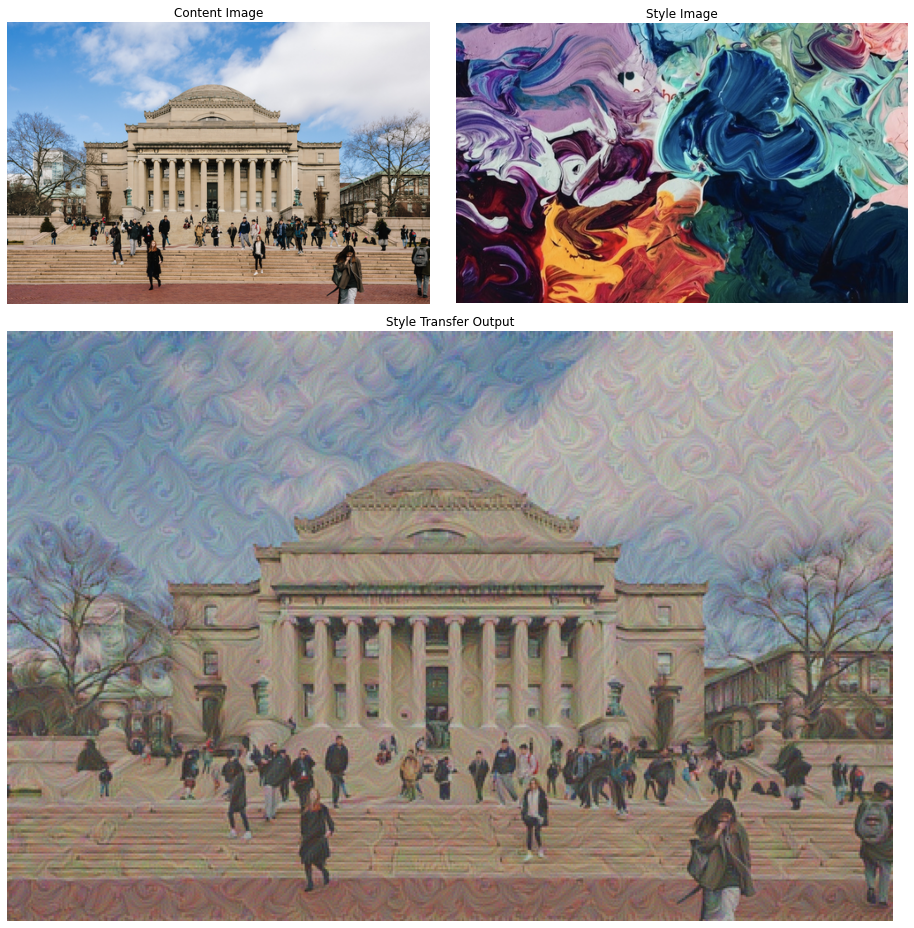

In [ ]:
content_weight = 1e3
style_weight = 1e-2

best_loss11, best_img11 = style_transfer(content_path1, style_path1, content_weight, style_weight, num_iterations=1000,learning_rate = 0.01)
display_result(content_path1, style_path1, best_img11)

In [ ]:
content_weight = 1e3
style_weight = 1e-2

best_loss11, best_img11 = style_transfer(content_path1, style_path1, content_weight, style_weight, num_iterations=1000,learning_rate = 1)
display_result(content_path1, style_path1, best_img11)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
content_weight = 1e3
style_weight = 1e-2

best_loss11, best_img11 = style_transfer(content_path1, style_path1, content_weight, style_weight, num_iterations=1000,learning_rate = 5)
display_result(content_path1, style_path1, best_img11)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
content_weight = 1e3
style_weight = 1e-2

best_loss11, best_img11 = style_transfer(content_path1, style_path1, content_weight, style_weight, num_iterations=1000,learning_rate = 10)
display_result(content_path1, style_path1, best_img11)

Output hidden; open in https://colab.research.google.com to view.

**Random Seeds**

In [ ]:
content_weight = 1e3
style_weight = 1e-2

best_loss11, best_img11 = style_transfer(content_path1, style_path1, content_weight, style_weight, num_iterations=1000, seed=0)
display_result(content_path1, style_path1, best_img11)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
best_loss11, best_img11 = style_transfer(content_path1, style_path1, content_weight, style_weight, num_iterations=1000, seed=100)
display_result(content_path1, style_path1, best_img11)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
best_loss11, best_img11 = style_transfer(content_path1, style_path1, content_weight, style_weight, num_iterations=1000, seed=1225)
display_result(content_path1, style_path1, best_img11)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
best_loss11, best_img11 = style_transfer(content_path1, style_path1, content_weight, style_weight, num_iterations=1000, seed=9999)
display_result(content_path1, style_path1, best_img11)

Output hidden; open in https://colab.research.google.com to view.

### Other Pre-trained Models

In [ ]:
import functools
import os
import numpy as np
import tensorflow as tf
import tensorflow_hub as hub
from tensorflow.keras.models import Model
from matplotlib import pyplot as plt
from PIL import Image
import matplotlib.gridspec as gridspec

In [ ]:
print("TF Version: ", tf.__version__)
print("TF-Hub version: ", hub.__version__)
print("Eager mode enabled: ", tf.executing_eagerly())
print("GPU available: ", tf.test.is_gpu_available())

TF Version:  2.4.0
TF-Hub version:  0.10.0
Eager mode enabled:  True
Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.
GPU available:  True


**Arbitrary Image Stylization Model**

In [ ]:
def load_image(image_path, image_size=(256, 256), preserve_aspect_ratio=True):
    # Load and convert to float32 numpy array, add batch dimension, and normalize to range [0, 1].
    img = plt.imread(image_path).astype(np.float32)[np.newaxis, ...]
    if img.max() > 1.0:
      img = img / 255.
    if len(img.shape) == 3:
      img = tf.stack([img, img, img], axis=-1)
    img = tf.image.resize(img, image_size, preserve_aspect_ratio=True)
    return img

def display_result(content_img, style_img, best_img=None):
    
    fig = plt.figure(figsize=(10,10))
    gridspec.GridSpec(2,2)

    plt.subplot2grid((3,2), (0,0))
    plt.imshow(content_img[0])
    plt.title('Content Image')
    plt.axis('off')
    
    plt.subplot2grid((3,2), (0,1))
    plt.imshow(style_img[0])
    plt.title('Style Image')
    plt.axis('off')
    
    if best_img is not None:
        plt.subplot2grid((3,2), (1,0), colspan=2, rowspan=2)
        plt.imshow(best_img[0])
        plt.title('Style Transfer Output')
        plt.axis('off')

    fig.tight_layout()
    plt.show()

In [ ]:
content1 = load_image(content_path1)
style1 = load_image(style_path1)
content2 = load_image(content_path2)
style2 = load_image(style_path2)

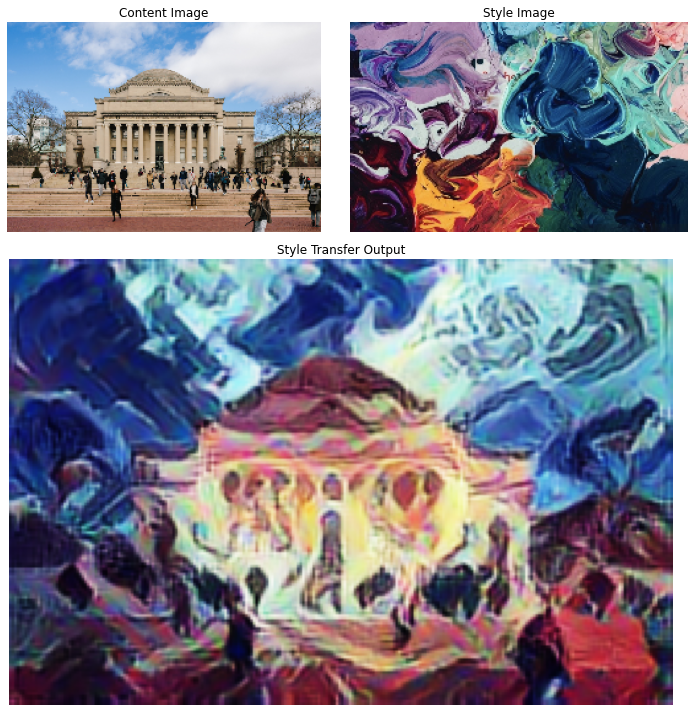

Time Taken =  397.7435131072998


In [ ]:
import time
start_time = time.time()
hub_handle = 'https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2'
hub_module = hub.load(hub_handle)
outputs1 = hub_module(content1, style1)
stylized_image1 = outputs1[0]
display_result(content1, style1, stylized_image1)
end_time = time.time()
print('Time Taken = ', end_time-start_time)

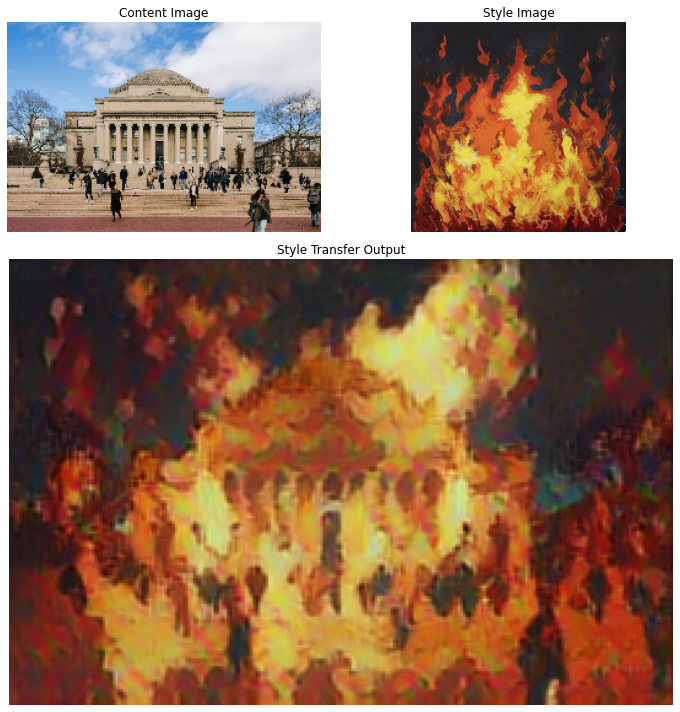

Time Taken =  393.0690541267395


In [ ]:
start_time = time.time()
hub_handle = 'https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2'
hub_module = hub.load(hub_handle)
outputs1_2 = hub_module(content1, style2)
stylized_image1_2 = outputs1_2[0]
display_result(content1, style2, stylized_image1_2)
end_time = time.time()
print('Time Taken = ', end_time-start_time)

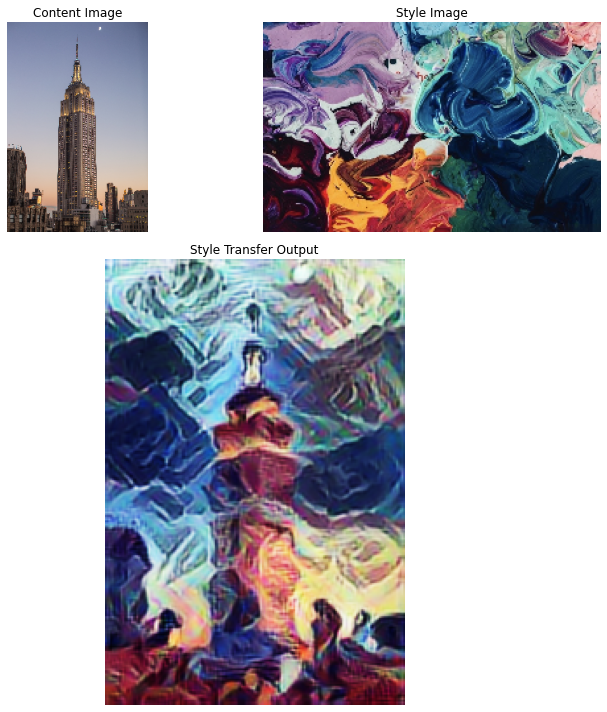

Time Taken =  395.16591691970825


In [ ]:
start_time = time.time()
hub_handle = 'https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2'
hub_module = hub.load(hub_handle)
outputs2_1 = hub_module(content2, style1)
stylized_image2_1 = outputs2_1[0]
display_result(content2, style1, stylized_image2_1)
end_time = time.time()
print('Time Taken = ', end_time-start_time)

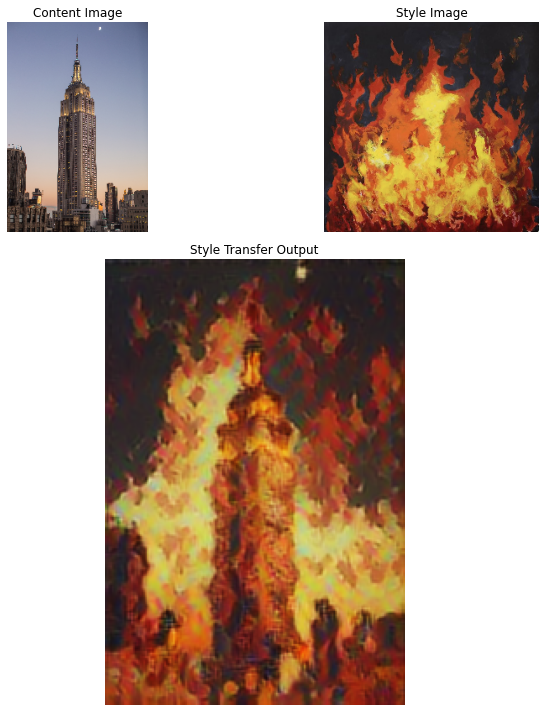

Time Taken =  394.72966623306274


In [ ]:
start_time = time.time()
hub_handle = 'https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2'
hub_module = hub.load(hub_handle)
outputs2_2 = hub_module(content2, style2)
stylized_image2_2 = outputs2_2[0]
display_result(content2, style2, stylized_image2_2)
end_time = time.time()
print('Time Taken = ', end_time-start_time)

**VGG-16**

In [ ]:
def get_noise_image(noise_ratio, content_img, seed):
    np.random.seed(seed)
    noise_img = np.random.uniform(-20., 20., content_img.shape).astype(np.float32)
    img = noise_ratio * noise_img + (1.-noise_ratio) * content_img
    return img
def load_image(img_path):
    img = Image.open(img_path)
    
    # limit the size of image to be 512 pixels
    max_dim = 512
    scale = max_dim/max(img.size)
    img = img.resize((round(img.size[0]*scale), round(img.size[1]*scale)), Image.ANTIALIAS)
    img = np.array(img).astype('uint8')
    
    return img


def load_and_process_image(img_path):
    img = load_image(img_path)
    
    # add batch dim for training purpose 
    img = np.expand_dims(img, axis=0)
    
    img = tf.keras.applications.vgg16.preprocess_input(img)
    
    return img

# ???
def deprocess_image(processed_img):
    x = processed_img.copy()
    if len(x.shape) == 4:
        x = np.squeeze(x, 0)
  
    # perform the inverse of the preprocessing step
    x[:, :, 0] += 103.939
    x[:, :, 1] += 116.779
    x[:, :, 2] += 123.68
    x = x[:, :, ::-1]
    x = np.clip(x, 0, 255).astype('uint8')
    
    return x


def display_result(content_path, style_path, best_img=None):
    content_img = load_image(content_path)
    style_img = load_image(style_path)
    
    fig = plt.figure(figsize=(13,13))
    gridspec.GridSpec(2,2)

    plt.subplot2grid((3,2), (0,0))
    plt.imshow(content_img)
    plt.title('Content Image')
    plt.axis('off')
    
    plt.subplot2grid((3,2), (0,1))
    plt.imshow(style_img)
    plt.title('Style Image')
    plt.axis('off')
    
    if best_img is not None:
        plt.subplot2grid((3,2), (1,0), colspan=2, rowspan=2)
        plt.imshow(best_img)
        plt.title('Style Transfer Output')
        plt.axis('off')

    fig.tight_layout()


In [ ]:
def build_model():
    
    # VGG16 based 
    vgg16 = tf.keras.applications.VGG16(include_top=False, weights='imagenet')
    vgg16.trainable = False
    
    content_layers = ['block5_conv2']
    style_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1', 'block5_conv1']

    content_outputs = [vgg16.get_layer(name).output for name in content_layers]
    style_outputs = [vgg16.get_layer(name).output for name in style_layers]

    model_outputs = content_outputs + style_outputs

    model = Model(inputs=vgg16.input, outputs=model_outputs)
    
    return model
    

def feature_extract(model, img, mode, num_content_layers=1):
    outputs = model(img)

    if mode == 'content':
      feature = [out for out in outputs[:num_content_layers]]
    elif mode == 'style':
      feature = [out for out in outputs[num_content_layers:]]
    
    return feature


In [ ]:
def get_content_loss(base_content, target_content):
    return tf.reduce_mean(tf.square(base_content - target_content))


def gram_matrix(input_tensor):
    num_filters = input_tensor.shape[-1]
    
    i = tf.reshape(input_tensor, [-1, num_filters])
    n = i.shape[0]
    gram = tf.matmul(i, i, transpose_a=True)
    
    return gram/n


def get_style_loss(base_style, target_style_gram):
    _, h, w, c = base_style.shape
    
    base_style_gram = gram_matrix(base_style)
    
    return tf.reduce_mean(tf.square(base_style_gram - target_style_gram)) #/ (4 * c**2 * (h*w)**2)


def compute_loss(model, base_img, target_content, target_style_gram, content_weight, style_weight):
    
    content_loss = 0
    style_loss = 0
    
    base_content = feature_extract(model, base_img, mode='content')
    base_style = feature_extract(model, base_img, mode='style')
    
    layer_weight_content = 1/len(target_content)
    for bc, tc in zip(base_content, target_content):
        content_loss += layer_weight_content * get_content_loss(bc, tc)
        
    layer_weight_style = 1/len(target_style_gram)
    for bs, tsg in zip(base_style, target_style_gram):
        style_loss += layer_weight_style * get_style_loss(bs, tsg)
        
    content_loss *= content_weight
    style_loss *= style_weight
    
    total_loss = content_loss + style_loss
    
    return total_loss, content_loss, style_loss
        

In [ ]:
def compute_grad(config):
    with tf.GradientTape() as tape:
        total_loss = compute_loss(**config)[0]
    return tape.gradient(total_loss, config['base_img']), total_loss


In [ ]:
model = build_model()
def style_transfer_16(content_path, style_path, content_weight, style_weight, num_iterations=500, seed = 0):

    content_img = load_and_process_image(content_path)
    style_img = load_and_process_image(style_path)
    noise_img = get_noise_image(0.5, content_img, seed)
    base_img = tf.Variable(noise_img.copy())

    target_content = feature_extract(model, content_img, mode='content')
    
    target_style = feature_extract(model, style_img, mode='style')
    target_style_gram = [gram_matrix(ts) for ts in target_style]
    
    config = {'model': model,
              'base_img': base_img,
              'target_content': target_content,
              'target_style_gram': target_style_gram,
              'content_weight': content_weight,
              'style_weight': style_weight}
    
    norm_means = np.array([103.939, 116.779, 123.68])
    min_vals = -norm_means
    max_vals = 255 - norm_means 
    
    best_loss, best_image = float('inf'), None
    
    optim = tf.keras.optimizers.Adam(learning_rate=5, beta_1=0.99, epsilon=0.1)
    total_loss_all = []
    for i in range(num_iterations):
        grad, total_loss = compute_grad(config)
        optim.apply_gradients([(grad, base_img)])
        total_loss_all.append(total_loss)

        clipped_img = tf.clip_by_value(base_img, min_vals, max_vals)
        base_img.assign(clipped_img)
        
        if total_loss < best_loss:
            best_loss = total_loss
            best_img = deprocess_image(base_img.numpy())
        
    return best_loss, best_img, total_loss_all


58892288/58889256 [==============================] - 1s 0us/step


In [ ]:
content_weight = 1e3
style_weight = 1e-2
start_time = time.time()
best_loss11_16, best_img11_16, total_loss11_16 = style_transfer_16(content_path1, style_path1, content_weight, style_weight, num_iterations=1000)

display_result(content_path1, style_path1, best_img11_16)
end_time = time.time()
print('Time Taken = ', end_time-start_time)

Output hidden; open in https://colab.research.google.com to view.

Time Taken =  96.35546064376831


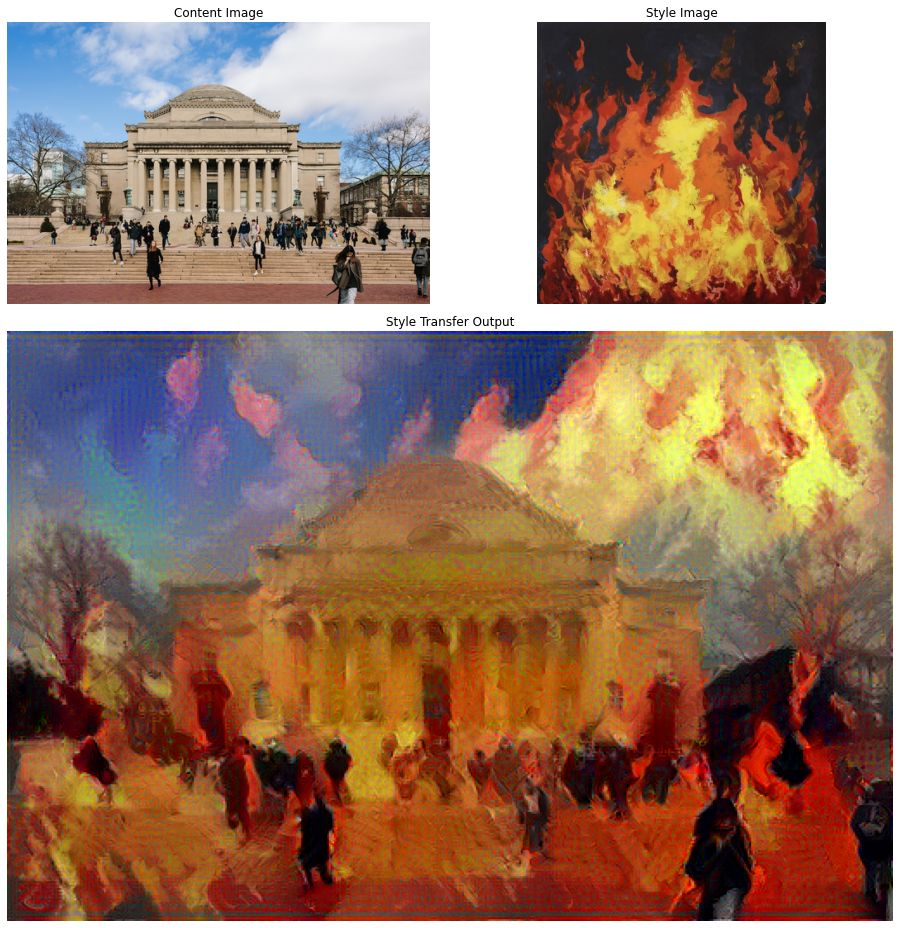

In [ ]:
start_time = time.time()
best_loss12_16, best_img12_16, total_loss12_16 = style_transfer_16(content_path1, style_path2, content_weight, style_weight, num_iterations=1000)

display_result(content_path1, style_path2, best_img12_16)
end_time = time.time()
print('Time Taken = ', end_time-start_time)

Time Taken =  100.43826794624329


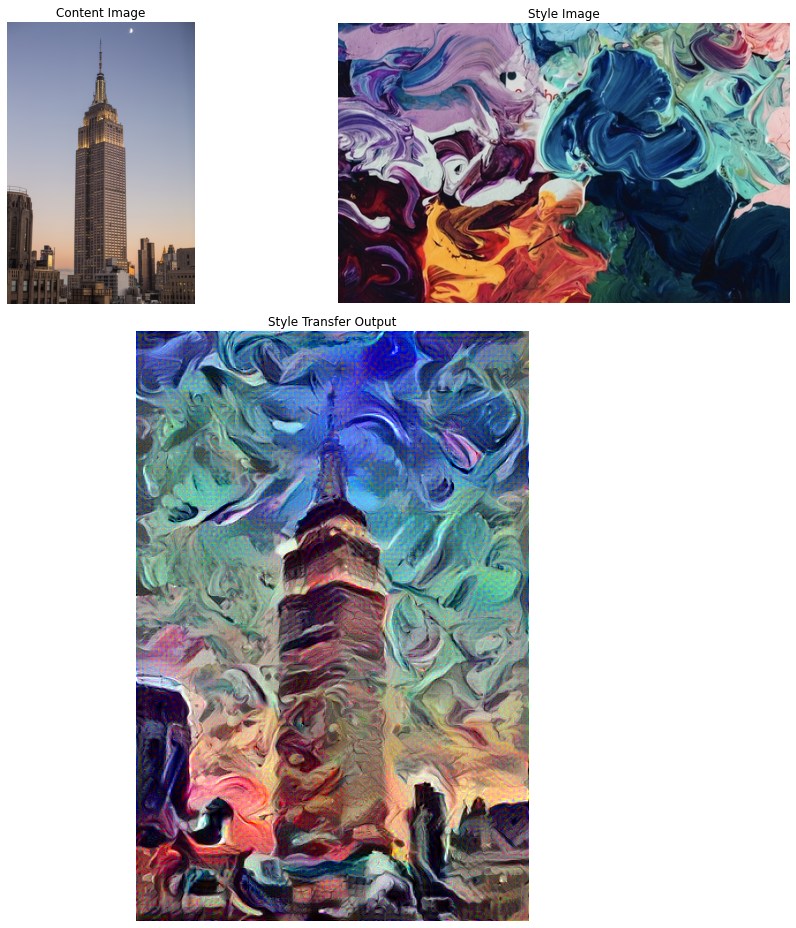

In [ ]:
start_time = time.time()
best_loss21_16, best_img21_16, total_loss21_16 = style_transfer_16(content_path2, style_path1, content_weight, style_weight, num_iterations=1000)

display_result(content_path2, style_path1, best_img21_16)
end_time = time.time()
print('Time Taken = ', end_time-start_time)

Time Taken =  100.49067878723145


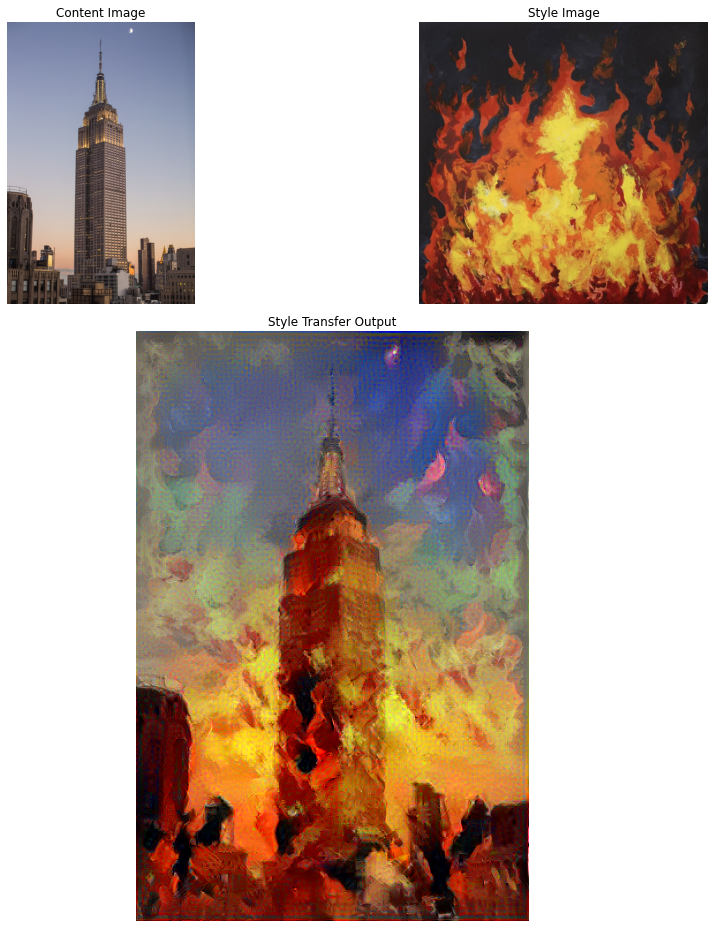

In [ ]:
start_time = time.time()
best_loss22_16, best_img22_16, total_loss22_16 = style_transfer_16(content_path2, style_path2, content_weight, style_weight, num_iterations=1000)

display_result(content_path2, style_path2, best_img22_16)
end_time = time.time()
print('Time Taken = ', end_time-start_time)

**ResNet-50**

In [ ]:
def build_model_res():
    
    # resnet50 based 
    # resnet50 = tf.keras.applications.ResNet152(include_top=False, weights='imagenet')
    resnet50 = tf.keras.applications.resnet50.ResNet50(include_top=False, weights='imagenet')
    resnet50.trainable = False
    
    content_layers = ['conv1_conv'] 
    style_layers = ['conv2_block2_1_conv','conv3_block1_3_conv','conv3_block1_0_conv','conv4_block2_2_conv']

    content_outputs = [resnet50.get_layer(name).output for name in content_layers]
    style_outputs = [resnet50.get_layer(name).output for name in style_layers]

    model_outputs = content_outputs + style_outputs

    model = Model(inputs=resnet50.input, outputs=model_outputs)
    
    return model
    

In [ ]:
model = build_model_res()
def style_transfer_res(content_path, style_path, content_weight, style_weight, num_iterations=500, seed = 0):

    content_img = load_and_process_image(content_path)
    style_img = load_and_process_image(style_path)
    noise_img = get_noise_image(0.5, content_img, seed)
    base_img = tf.Variable(content_img.copy())

    target_content = feature_extract(model, content_img, mode='content')
    
    target_style = feature_extract(model, style_img, mode='style')
    target_style_gram = [gram_matrix(ts) for ts in target_style]
    
    config = {'model': model,
              'base_img': base_img,
              'target_content': target_content,
              'target_style_gram': target_style_gram,
              'content_weight': content_weight,
              'style_weight': style_weight}
    
    norm_means = np.array([103.939, 116.779, 123.68])
    min_vals = -norm_means
    max_vals = 255 - norm_means 
    
    best_loss, best_image = float('inf'), None
    
    optim = tf.keras.optimizers.Adam(learning_rate=5, beta_1=0.99, epsilon=0.1)
    total_loss_all = []
    for i in range(num_iterations):
        grad, total_loss = compute_grad(config)
        optim.apply_gradients([(grad, base_img)])
        total_loss_all.append(total_loss)

        clipped_img = tf.clip_by_value(base_img, min_vals, max_vals)
        base_img.assign(clipped_img)
        
        if total_loss < best_loss:
            best_loss = total_loss
            best_img = deprocess_image(base_img.numpy())
        
    return best_loss, best_img, total_loss_all


94773248/94765736 [==============================] - 3s 0us/step


In [ ]:
import time
#resnet50
content_weight = 1
style_weight = 1e6
start_time = time.time()
best_loss11_res, best_img11_res, total_loss11_res = style_transfer_res(content_path1, style_path1, content_weight, style_weight, num_iterations=1000)

display_result(content_path1, style_path1, best_img11_res)
end_time = time.time()
print('Time Taken = ', end_time-start_time)

Output hidden; open in https://colab.research.google.com to view.

Time Taken =  76.86832690238953


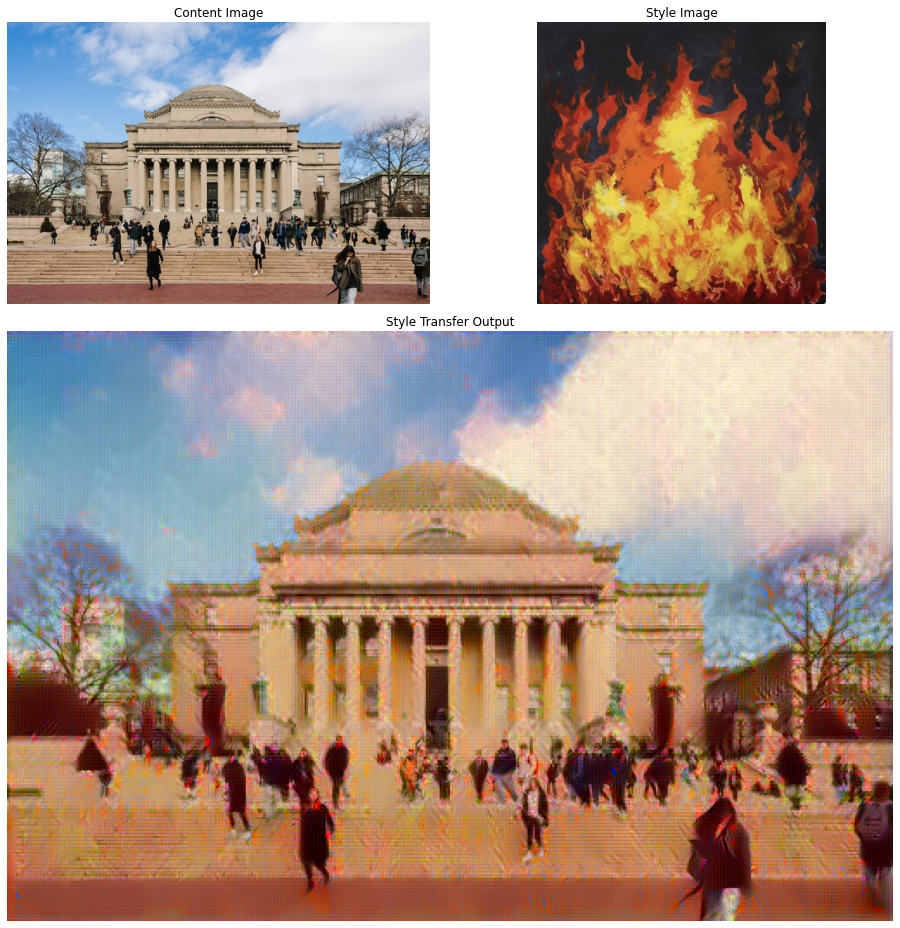

In [ ]:
import time
start_time = time.time()
best_loss12_res, best_img12_res, total_loss12_res = style_transfer_res(content_path1, style_path2, content_weight, style_weight, num_iterations=1000)

display_result(content_path1, style_path2, best_img12_res)
end_time = time.time()
print('Time Taken = ', end_time-start_time)

Time Taken =  78.16986680030823


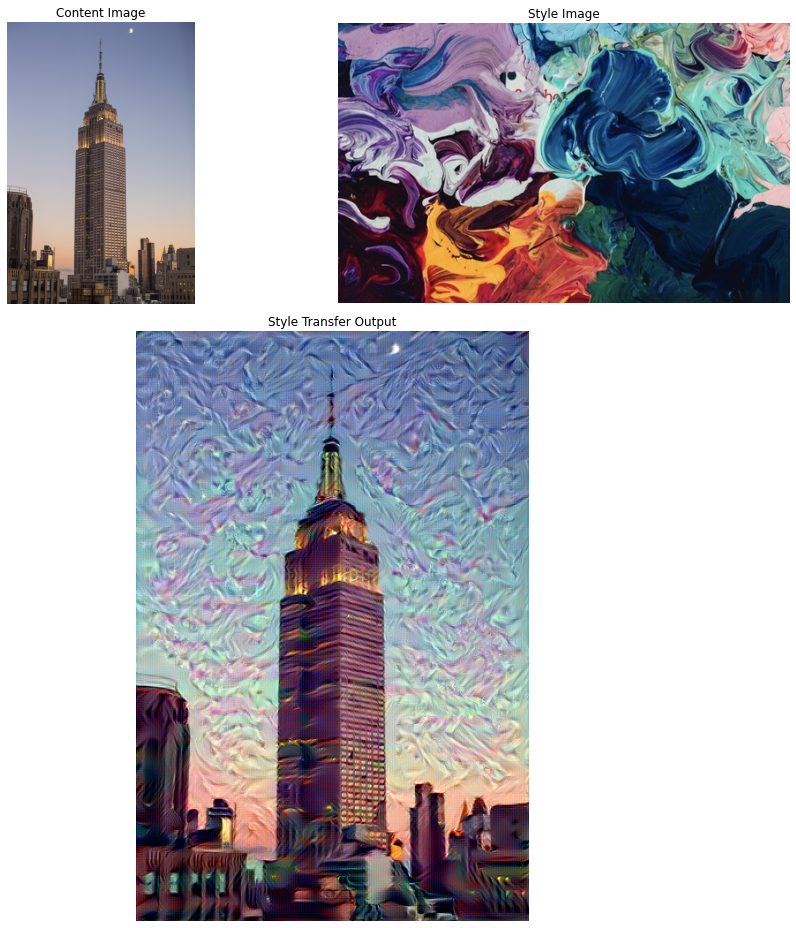

In [ ]:
import time
start_time = time.time()
best_loss21_res, best_img21_res, total_loss21_res = style_transfer_res(content_path2, style_path1, content_weight, style_weight, num_iterations=1000)

display_result(content_path2, style_path1, best_img21_res)
end_time = time.time()
print('Time Taken = ', end_time-start_time)

Time Taken =  77.45550990104675


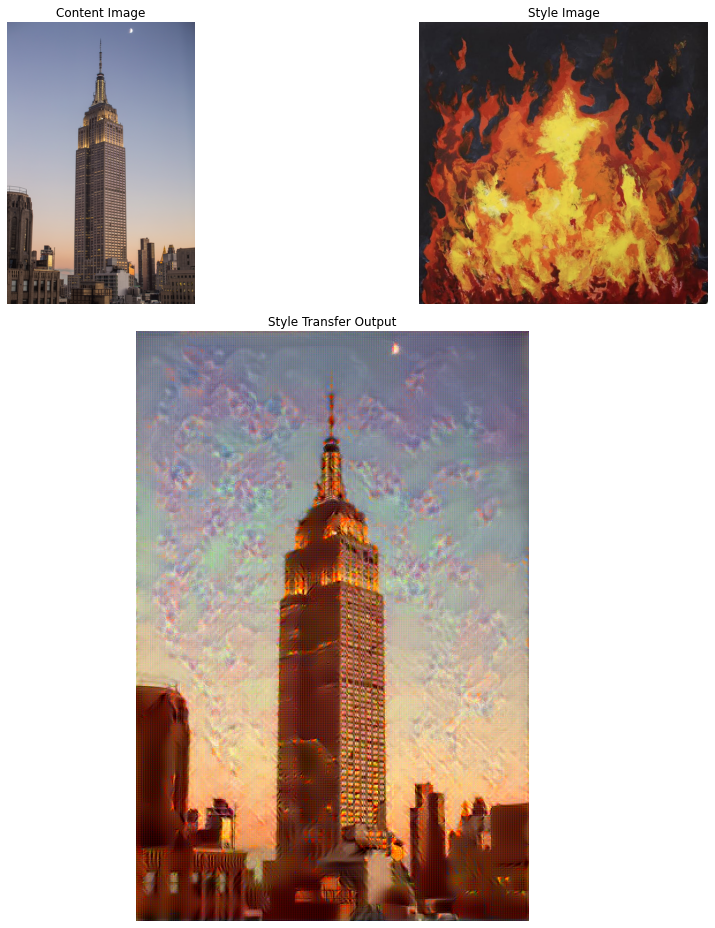

In [ ]:
import time
start_time = time.time()
best_loss22_res, best_img22_res, total_loss22_res = style_transfer_res(content_path2, style_path2, content_weight, style_weight, num_iterations=1000)

display_result(content_path2, style_path2, best_img22_res)
end_time = time.time()
print('Time Taken = ', end_time-start_time)

**Total Loss with Different Model**

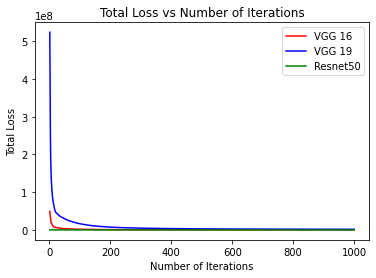

In [ ]:
plt.plot(range(1,1001), total_loss11_16, color = 'red', label='VGG 16')
plt.plot(range(1,1001), total_loss11_19, color = 'blue', label='VGG 19')
plt.plot(range(1,1001), total_loss11_res, color = 'green', label='Resnet50')
plt.title('Total Loss vs Number of Iterations')
plt.xlabel('Number of Iterations')
plt.ylabel('Total Loss')
plt.legend()
plt.show()

**Total Loss with Naive Models**

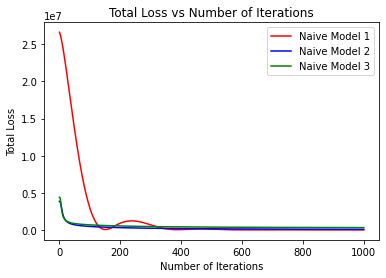

In [ ]:
plt.plot(range(1,1001), total_loss_naive1, color = 'red', label='Naive Model 1')
plt.plot(range(1,1001), total_loss_naive2, color = 'blue', label='Naive Model 2')
plt.plot(range(1,1001), total_loss_naive3, color = 'green', label='Naive Model 3')
plt.title('Total Loss vs Number of Iterations')
plt.xlabel('Number of Iterations')
plt.ylabel('Total Loss')
plt.legend()
plt.show()